# Basic Usage of OmiCLIP Model
This notebook demonstrates the basic usage of OmiCLIP model, including loading model, encoding text and image, calculating similairty between image embeddings and text embeddings, and examples of preprocess ST data, scRNA-seq data, bulk RNA-seq data, and whole image. It takes about 30 mins to run this notebook using cpu on MacBook Pro.

In [1]:
import os
import pandas as pd
import numpy as np
import scanpy as sc
import anndata
from PIL import Image

import loki.utils
import loki.preprocess

/opt/anaconda3/envs/loki_env/lib/python3.9/site-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


The sample data are stored in the directory `data/basic_usage`, which can be donwloaded from [Google Drive link](https://drive.google.com/file/d/1aPK1nItsOEPxTihUAKMig-vLY-DMMIce/view?usp=sharing).

In [ ]:
data_dir = './data'

## Load OmiCLIP Model
The pretrained weights are avaliable on [Hugging Face](https://huggingface.co/WangGuangyuLab/Loki).

In [ ]:
model_path = os.path.join(data_dir, 'checkpoint.pt')
device = 'gpu' if loki.utils.is_gpu_available() else 'cpu'

In [4]:
model, preprocess, tokenizer = loki.utils.load_model(model_path, device)

In [5]:
model.eval()

CoCa(
  (text): TextTransformer(
    (token_embedding): Embedding(49408, 768)
    (transformer): Transformer(
      (resblocks): ModuleList(
        (0-11): 12 x ResidualAttentionBlock(
          (ln_1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
          )
          (ls_1): Identity()
          (ln_2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): Sequential(
            (c_fc): Linear(in_features=768, out_features=3072, bias=True)
            (gelu): GELU(approximate='none')
            (c_proj): Linear(in_features=3072, out_features=768, bias=True)
          )
          (ls_2): Identity()
        )
      )
    )
    (ln_final): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
  )
  (visual): VisionTransformer(
    (conv1): Conv2d(3, 1024, kernel_size=(14, 14), stride=(14, 14), bias=False)
    (patch_drop

## Encode Image
Use OmiCLIP to encode image.

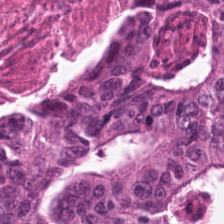

In [6]:
image_path = os.path.join(data_dir, 'demo_data', 'TUM-TCGA-TLSHWGSQ.tif')
image = Image.open(image_path)
image

In [7]:
image_embeddings = loki.utils.encode_images(model, preprocess, [image_path], device)
image_embeddings.shape

torch.Size([1, 768])

## Encode Text
Use OmiCLIP to encode text.

In [8]:
text = ['TP53 EPCAM KRAS EGFR DEFA5 DEFA6 CEACAM5 CEA KRT18 KRT8 KRT19 CDH17 CK20 MYO6 TP53BP2 PLA2G2A CLDN7 TJP1 PKP3 DSP']
text_embeddings = loki.utils.encode_texts(model, tokenizer, text, device)
text_embeddings.shape

torch.Size([1, 768])

## Calculate Similarity
Calculate similairty between image embeddings and text embeddings.

In [9]:
dot_similarity = image_embeddings @ text_embeddings.T

In [10]:
dot_similarity

tensor([[0.3926]])

## Examples of preprocessing ST data, scRNA-seq data, bulk RNA-seq data, and whole image
Examples of using .h5ad object (ST data or scRNA-seq data) and .gct object (bulk RNA-seq data) to generate text embeddings, and examples of using whole image to generate image patch embeddings.

### Encode transcriptome from AnnData object (ST data or scRNA-seq data)
Example of encoding transcriptome from .h5ad object. House keeping gene list is obtained from the Molecular Signatures Database (MSigDB): https://www.gsea-msigdb.org/gsea/msigdb/. It takes about 3 mins to run this section using cpu on MacBook Pro.

In [11]:
ad_path = os.path.join(data_dir, 'demo_data', 'RZ_GT_P2.h5ad')
ad = sc.read_h5ad(ad_path)
ad

AnnData object with n_obs × n_vars = 3538 × 14467
    obs: 'n_counts', 'n_genes', 'percent.mt', 'Adipocyte', 'Cardiomyocyte', 'Endothelial', 'Fibroblast', 'Lymphoid', 'Mast', 'Myeloid', 'Neuronal', 'Pericyte', 'Cycling.cells', 'vSMCs', 'cell_type_original', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'ethnicity_ontology_term_id', 'is_primary_data', 'organism_ontology_term_id', 'sex_ontology_term_id', 'tissue_ontology_term_id', 'leiden', 'pixel_y', 'pixel_x', 'cell_type'
    var: 'features'
    uns: 'X_approximate_distribution', 'X_normalization', 'default_embedding', 'leiden', 'neighbors', 'schema_version', 'spatial', 'title'
    obsm: 'X_pca', 'X_spatial', 'X_umap', 'spatial'
    obsp: 'connectivities', 'distances'

In [12]:
house_keeping_genes = pd.read_csv(os.path.join(data_dir, 'demo_data', 'housekeeping_genes.csv'), index_col = 0)
top_k_genes_str = loki.preprocess.generate_gene_df(ad, house_keeping_genes)
top_k_genes_str

,label
RZ_GT_P2_AAACAAGTATCTCCCA-1,TTN MYH7 MB MALAT1 MTRNR2L12 TPM1 DES CRYAB AP...
RZ_GT_P2_AAACAATCTACTAGCA-1,MYH7 MTRNR2L12 TTN CRYAB MYL2 MB TNNT2 DES TPM...
RZ_GT_P2_AAACACCAATAACTGC-1,TTN MYH7 MTRNR2L12 MB MALAT1 CRYAB TNNI3 DES A...
RZ_GT_P2_AAACAGAGCGACTCCT-1,TTN MYH7 MALAT1 MTRNR2L12 MYL2 MB TPM1 MYL3 CR...
RZ_GT_P2_AAACAGCTTTCAGAAG-1,MB MYH7 TTN CRYAB MTRNR2L12 TNNI3 TPM1 MYL2 DE...
...,...
RZ_GT_P2_TTGTTGTGTGTCAAGA-1,DES MB TCAP MYH7 TPM1 FN1 CMYA5 TNNI3 COL3A1 S...
RZ_GT_P2_TTGTTTCACATCCAGG-1,TTN MYH7 MTRNR2L12 MALAT1 MB CRYAB DES TNNC1 M...
RZ_GT_P2_TTGTTTCATTAGTCTA-1,TTN MALAT1 MYH7 MTRNR2L12 MB DES CRYAB TNNI3 T...
RZ_GT_P2_TTGTTTCCATACAACT-1,MTRNR2L12 MB MYH7 TTN CRYAB IGKC DES MALAT1 TP...


In [13]:
text_embeddings = loki.utils.encode_text_df(model, tokenizer, top_k_genes_str, 'label', device)
text_embeddings.shape

torch.Size([3538, 768])

### Encode transcriptome from GCT object (bulk RNA-seq data)
Example of encoding transcriptome from .gct object.

In [14]:
sc_data_path = os.path.join(data_dir, 'demo_data', 'bulk_fibroblasts.gct')
gct_data = loki.preprocess.read_gct(sc_data_path)
gct_data

,id,Name,Description,GTEX-111VG-0008-SM-5Q5BG,GTEX-111YS-0008-SM-5Q5BH,GTEX-1122O-0008-SM-5QGR2,GTEX-1128S-0008-SM-5Q5DP,GTEX-113IC-0008-SM-5QGRF,GTEX-113JC-0008-SM-5QGR6,GTEX-117XS-0008-SM-5Q5DQ,...,GTEX-ZVE2-0008-SM-51MRU,GTEX-ZVP2-0008-SM-51MSL,GTEX-ZVT2-0008-SM-57WC9,GTEX-ZVT3-0008-SM-51MRI,GTEX-ZVT4-0008-SM-57WCA,GTEX-ZVTK-0008-SM-57WDA,GTEX-ZVZP-0008-SM-51MSX,GTEX-ZVZQ-0008-SM-51MSK,GTEX-ZXES-0008-SM-57WCX,GTEX-ZXG5-0008-SM-57WDB
0,0,ENSG00000223972.5,DDX11L1,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
1,1,ENSG00000227232.5,WASH7P,21,31,16,41,57,46,66,...,24,62,40,42,64,58,62,52,20,32
2,2,ENSG00000278267.1,MIR6859-1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,3,ENSG00000243485.5,MIR1302-2HG,0,0,0,0,1,0,0,...,1,0,0,0,1,0,0,1,0,0
4,4,ENSG00000237613.2,FAM138A,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56195,56195,ENSG00000198695.2,MT-ND6,35691,34685,50128,81334,60140,81957,48581,...,60506,94854,76311,87410,63940,108716,70445,78721,68057,53557
56196,56196,ENSG00000210194.1,MT-TE,8,19,28,47,31,40,25,...,35,53,23,34,21,52,29,32,19,27
56197,56197,ENSG00000198727.2,MT-CYB,161038,154424,138836,246421,194695,225034,214565,...,269451,296274,335286,274560,186433,312236,499192,258581,241541,173705
56198,56198,ENSG00000210195.2,MT-TT,0,1,1,6,2,0,2,...,1,1,3,3,6,3,3,1,1,0


In [15]:
bulk_ad = anndata.AnnData(pd.DataFrame(gct_data.iloc[:, 3:].mean(axis=1)).T)
bulk_ad.var.index = gct_data['Description']
bulk_text_feature = loki.preprocess.generate_gene_df(bulk_ad, house_keeping_genes, todense=False)
bulk_text_feature

/opt/anaconda3/envs/loki_env/lib/python3.9/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/opt/anaconda3/envs/loki_env/lib/python3.9/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


,label
0,FN1 COL1A1 COL1A2 COL6A3 TGFBI THBS1 COL6A2 CO...


In [16]:
text_embeddings = loki.utils.encode_text_df(model, tokenizer, bulk_text_feature, 'label', device)
text_embeddings.shape

torch.Size([1, 768])

### Encode patches from a whole image
Example of encoding patches from a whole image. It takes about 28 mins to run this section using cpu on MacBook Pro.

In [17]:
coord = pd.read_csv(os.path.join(data_dir, 'demo_data', 'coord.csv'), index_col=0)
coord

,pixel_x,pixel_y
GSM5924033_AAACAACGAATAGTTC-1,1579.906543,152.803738
GSM5924033_AAACAAGTATCTCCCA-1,478.504673,1266.355141
GSM5924033_AAACAATCTACTAGCA-1,1234.112151,219.626168
GSM5924033_AAACACCAATAACTGC-1,1541.121497,1467.289721
GSM5924033_AAACAGAGCGACTCCT-1,581.308412,464.485982
...,...,...
GSM5924033_TTGTTTCACATCCAGG-1,1246.728973,1444.859814
GSM5924033_TTGTTTCATTAGTCTA-1,1400.000001,1489.252338
GSM5924033_TTGTTTCCATACAACT-1,1438.785048,1155.140188
GSM5924033_TTGTTTGTATTACACG-1,1259.345795,1778.971964


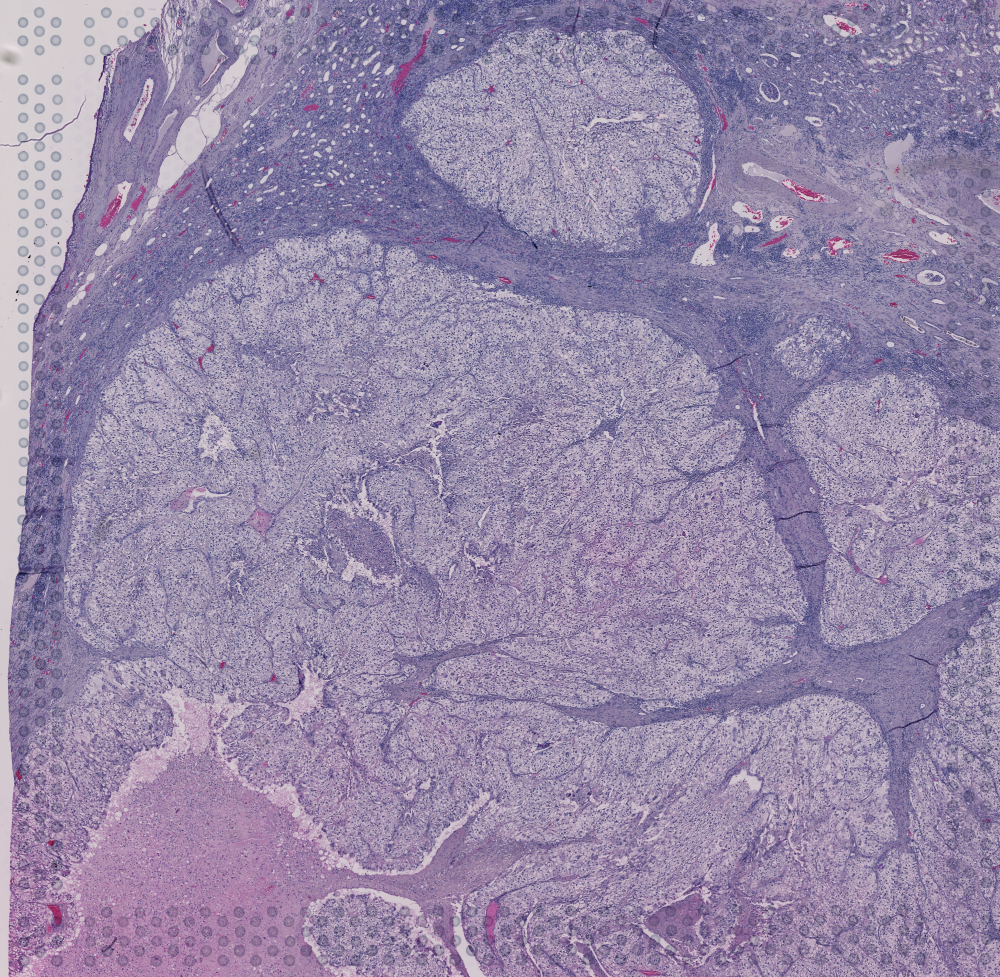

In [18]:
img = Image.open(os.path.join(data_dir, 'demo_data', 'whole_img.png'))
img

In [19]:
img_array = np.asarray(img)
patch_dir = os.path.join(data_dir, 'demo_data', 'patch')
loki.preprocess.segment_patches(img_array, coord, patch_dir)

In [20]:
img_list = os.listdir(patch_dir)
patch_paths = [os.path.join(patch_dir, fn) for fn in img_list]

In [21]:
image_embeddings = loki.utils.encode_images(model, preprocess, patch_paths, device)
image_embeddings.shape

torch.Size([4975, 768])